# Group photo selector and best face detector

This program select the best photo in a set of similar group photos on base with emotions analysis. Using the open source library [DeepFace](https://github.com/serengil/deepface) to detect the emotions of the people and select the photo with the most positive emotions. Also, search for the best face in all photos and provide a JSON file with the coordinates of the face and name files to merge in post-processing with Photoshop.

## Steps explanation
1. Load the images with `cv2`.
2. Resize the images to a smaller size to speed up the process. 
3. Detect the faces in the images using the `opencv` face detector to find the working area.
4. Crop the working area in the full size image.
5. Detect the faces in the working area using the `retinaface` detector and create the embeddings of the faces with the model `ArcFace`.
6. Analyze the emotions of the faces using the `DeepFace` library for each face for better results.
7. Select the photo with the most positive emotions.
8. Search the similar faces using the embeddings and select the best face in all photos on base with the emotions analysis.
9. If is need, it is possible to select the best face manually.
10. Create a JSON file with the coordinates of the face and name files to merge in post-processing with Photoshop.

In [1]:
# Load libraries
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
from IPython.display import display
import cv2
import os
import json
from tqdm import tqdm
import time

In [ ]:
# Load DeepFace
from deepface import DeepFace

# DeepFace parameters
backends = 'retinaface' # 'opencv', 'retinaface', 'mtcnn', 'ssd', 'dlib', 'mediapipe', 'yolov8'
model_name = 'ArcFace' # 'VGG-Face', 'Facenet', 'OpenFace', 'DeepFace', 'DeepID', 'Dlib'
normalization = 'ArcFace'
distance_metric = 'euclidean_l2' # 'cosine'
# Empty image to test DeepFace
empty_img = np.zeros((224, 224, 3), dtype=np.uint8)
faces = DeepFace.represent(empty_img, model_name=model_name, enforce_detection=False, detector_backend=backends, normalization=normalization)


In [ ]:
help(DeepFace)

In [4]:
# Constants
FONT_SCALE = 2e-3
THICKNESS_SCALE = 1e-3

In [5]:
# Show an image from openCV in RGB format
def show_rgb_image(image_org, title=None, conversion=cv2.COLOR_BGR2RGB, figsize=(16, 10), array_align = 'horizontal', save=False, save_path=''):
    """ Show an image from openCV in RGB format"""

    if isinstance(image_org, list):
        n_images = len(image_org)
        images = image_org.copy()
    else :
        n_images = 1
        images = [image_org].copy()
    # Converts from one colour space to the other. this is needed as RGB
    # is not the default colour space for OpenCV
    images = [cv2.cvtColor(image, conversion) for image in images]

    # Create a new figure
    if array_align == 'horizontal':
        fig, axs = plt.subplots(1, n_images, figsize=figsize)
    elif array_align == 'vertical':
        fig, axs = plt.subplots(n_images, 1, figsize=figsize)

    if n_images == 1:
        axs = [axs]

    for i, img in enumerate(images):
        # Show the image
        axs[i].imshow(img)
        # remove the axis / ticks for a clean looking image
        axs[i].axis('off')

    # if a title is provided, show it
    if title is not None:
        plt.title(title)

    # Save the image
    if save:
        if save_path == '':
            raise ValueError('You must provide a path to save the image')
        
        # Crop the with frame and save it
        plt.savefig(save_path, bbox_inches='tight')
    
    plt.show()

# Crop the face from an image
def crop_face_from_image(image, analysis, save=False, save_path='', margin=0.2):

    # Get the region of the face
    x, y, w, h = analysis['facial_area'].values()    
    margin = int(margin * w)
    img = image[y-margin:y+h+margin, x-margin:x+w+margin]
    height, width, _ = img.shape

    # Create a white border around the image
    b_top = int(0.07 * height)
    b_bottom = int(0.05 * height)
    b_left = b_right = int(0.05 * width)
    img = cv2.copyMakeBorder(img, b_top, b_bottom, b_left, b_right, cv2.BORDER_CONSTANT, value=[255, 255, 255])

    # Get the emotion and confidence
    try :
        emotion = analysis['dominant_emotion']
        emotion_confidence = analysis['emotion'][emotion]
    except :
        emotion = 'None'
        emotion_confidence = 0.0

    # Add the emotion to the image
    title      = f'Emotion: {emotion} | {emotion_confidence:.4f}'
    # Fit the text to the image
    font_size = height * FONT_SCALE
    thickness = max(int(height * THICKNESS_SCALE), 1)
    cv2.putText(img, title, (5, 12), cv2.FONT_HERSHEY_SIMPLEX, font_size, (0, 0, 0), thickness)

    if save:
        cv2.imwrite(save_path, img)
    return img


In [8]:
# Select the work directory
work_dir = './Example'

# list the PNG files in the directory
# image_path = [f for f in os.listdir(work_dir) if f.endswith('.png')]
image_path = [os.path.join(work_dir, f) for f in os.listdir(work_dir) if f.endswith('.png')]

# Create the output directory if it does not exist
output_dir = os.path.join(work_dir, 'Output')
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Print the images to be processed
print(f'Images to be processed: {len(image_path)}')
_ = [print(f) for f in image_path]

Images to be processed: 11
./Example/img_001.png
./Example/img_002.png
./Example/img_003.png
./Example/img_004.png
./Example/img_005.png
./Example/img_006.png
./Example/img_007.png
./Example/img_008.png
./Example/img_009.png
./Example/img_010.png
./Example/img_011.png


In [9]:
# Load the images
group_img = {}
for img in image_path:
    # Get the name of the image
    img_name = img.split('/')[-1].split('.')[0]

    print(f'Loading image: {img_name}')
    photo = {}
    photo['img_name'] = img_name
    photo['img_path'] = img
    photo['img_original'] = cv2.imread(img)

    group_img[img_name] = photo


Loading image: img_001


Loading image: img_002
Loading image: img_003
Loading image: img_004
Loading image: img_005
Loading image: img_006
Loading image: img_007
Loading image: img_008
Loading image: img_009
Loading image: img_010
Loading image: img_011


Processing image: img_001
   Original | size: (1080, 1920, 3), memory in MB: 6.22
     Resize | size: (1080, 1920, 3), memory in MB: 6.22


2024-03-05 18:58:56.847227: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.02GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-03-05 18:58:57.031222: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.02GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-03-05 18:59:03.949636: W external/local_tsl/tsl/framework/bfc_allocator.cc:366] Garbage collection: deallocate free memory regions (i.e., allocations) so that we can re-allocate a larger region to avoid OOM due to memory fragmentation. If you see this message frequently, you are running near the threshold of the available device memory and re-allocation may incur great p

            | Number of faces: 7
            | Resized area of faces: [210, 74, 1592, 632]
            | Original area of faces: [210, 74, 1592, 632]
       Work | size: (558, 1382, 3), memory in MB: 2.31


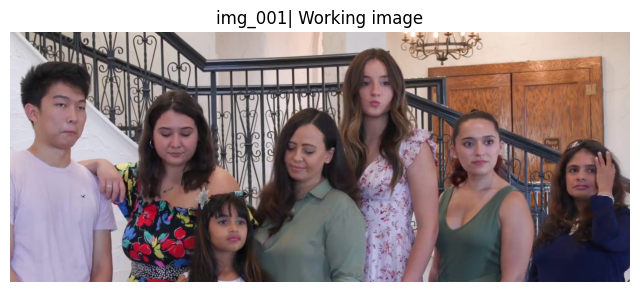

Processing image: img_002
   Original | size: (1080, 1920, 3), memory in MB: 6.22
     Resize | size: (1080, 1920, 3), memory in MB: 6.22
            | Number of faces: 7
            | Resized area of faces: [201, 76, 1571, 633]
            | Original area of faces: [201, 76, 1571, 633]
       Work | size: (557, 1370, 3), memory in MB: 2.29


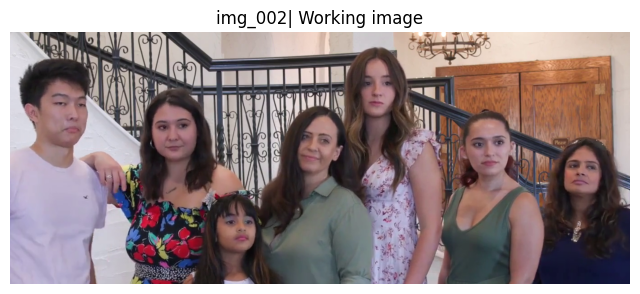

Processing image: img_003
   Original | size: (1080, 1920, 3), memory in MB: 6.22
     Resize | size: (1080, 1920, 3), memory in MB: 6.22
            | Number of faces: 7
            | Resized area of faces: [193, 77, 1594, 631]
            | Original area of faces: [193, 77, 1594, 631]
       Work | size: (554, 1401, 3), memory in MB: 2.33


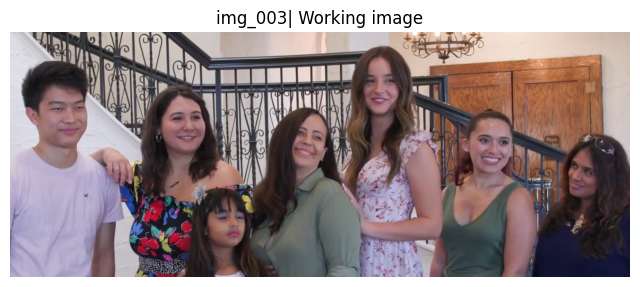

Processing image: img_004
   Original | size: (1080, 1920, 3), memory in MB: 6.22
     Resize | size: (1080, 1920, 3), memory in MB: 6.22
            | Number of faces: 7
            | Resized area of faces: [190, 75, 1599, 640]
            | Original area of faces: [190, 75, 1599, 640]
       Work | size: (565, 1409, 3), memory in MB: 2.39


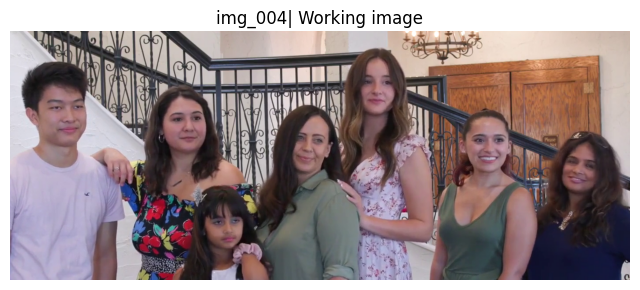

Processing image: img_005
   Original | size: (1080, 1920, 3), memory in MB: 6.22
     Resize | size: (1080, 1920, 3), memory in MB: 6.22
            | Number of faces: 7
            | Resized area of faces: [196, 80, 1604, 641]
            | Original area of faces: [196, 80, 1604, 641]
       Work | size: (561, 1408, 3), memory in MB: 2.37


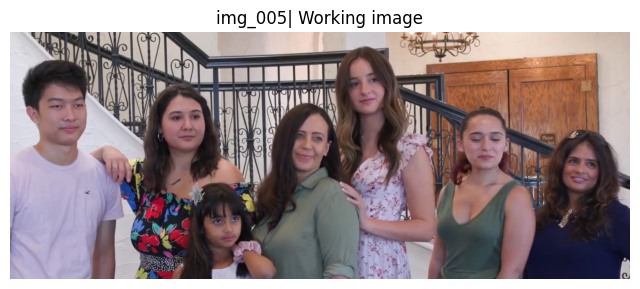

Processing image: img_006
   Original | size: (1080, 1920, 3), memory in MB: 6.22
     Resize | size: (1080, 1920, 3), memory in MB: 6.22
            | Number of faces: 7
            | Resized area of faces: [185, 79, 1599, 636]
            | Original area of faces: [185, 79, 1599, 636]
       Work | size: (557, 1414, 3), memory in MB: 2.36


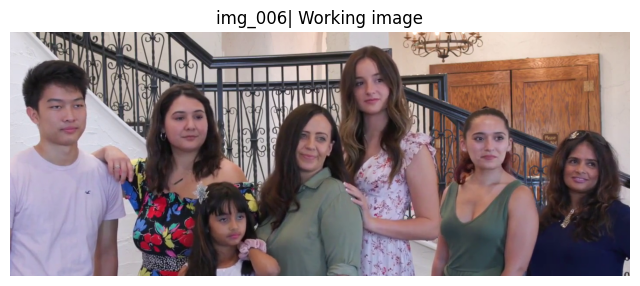

Processing image: img_007
   Original | size: (1080, 1920, 3), memory in MB: 6.22
     Resize | size: (1080, 1920, 3), memory in MB: 6.22
            | Number of faces: 7
            | Resized area of faces: [186, 91, 1615, 625]
            | Original area of faces: [186, 91, 1615, 625]
       Work | size: (534, 1429, 3), memory in MB: 2.29


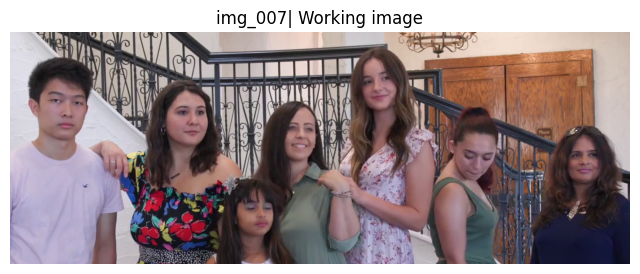

Processing image: img_008
   Original | size: (1080, 1920, 3), memory in MB: 6.22
     Resize | size: (1080, 1920, 3), memory in MB: 6.22
            | Number of faces: 7
            | Resized area of faces: [208, 80, 1590, 621]
            | Original area of faces: [208, 80, 1590, 621]
       Work | size: (541, 1382, 3), memory in MB: 2.24


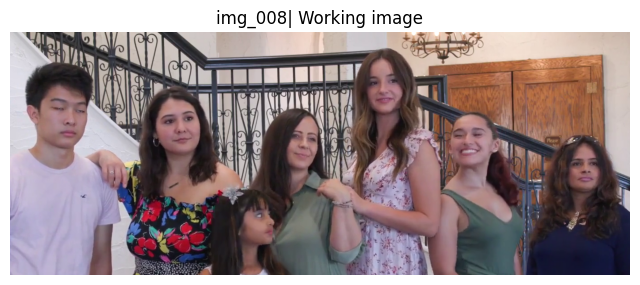

Processing image: img_009
   Original | size: (1080, 1920, 3), memory in MB: 6.22
     Resize | size: (1080, 1920, 3), memory in MB: 6.22
            | Number of faces: 7
            | Resized area of faces: [208, 80, 1589, 621]
            | Original area of faces: [208, 80, 1589, 621]
       Work | size: (541, 1381, 3), memory in MB: 2.24


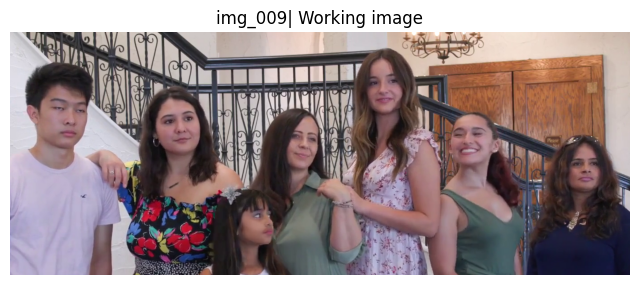

Processing image: img_010
   Original | size: (1080, 1920, 3), memory in MB: 6.22
     Resize | size: (1080, 1920, 3), memory in MB: 6.22
            | Number of faces: 7
            | Resized area of faces: [221, 80, 1590, 626]
            | Original area of faces: [221, 80, 1590, 626]
       Work | size: (546, 1369, 3), memory in MB: 2.24


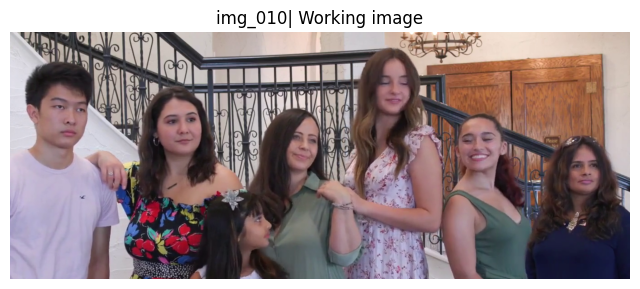

Processing image: img_011
   Original | size: (1080, 1920, 3), memory in MB: 6.22
     Resize | size: (1080, 1920, 3), memory in MB: 6.22
            | Number of faces: 7
            | Resized area of faces: [235, 71, 1680, 614]
            | Original area of faces: [235, 71, 1680, 614]
       Work | size: (543, 1445, 3), memory in MB: 2.35


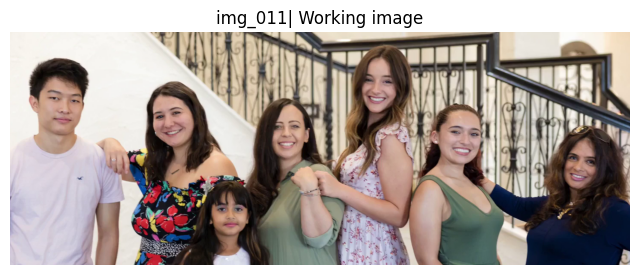

In [10]:
# Preporcesing the images and find the area with the faces
proportion_resize = 0.3
show_img = False
for photo in group_img:
    print(f'Processing image: {photo}')
    # Original image
    img_height, img_width, _ = group_img[photo]["img_original"].shape
    print(f'   Original | size: {group_img[photo]["img_original"].shape}, memory in MB: {group_img[photo]["img_original"].nbytes / 1e6:.2f}')

    # Resize the image
    if img_height < 2500 :
        proportion_resize = 1.0
    
    resize_height = int(img_height * proportion_resize)
    resize_width = int(img_width * proportion_resize)
    img_resized = cv2.resize(group_img[photo]["img_original"].copy(), (resize_width, resize_height), interpolation = cv2.INTER_AREA)
    print(f'     Resize | size: {img_resized.shape}, memory in MB: {img_resized.nbytes / 1e6:.2f}')

    # Find the faces in the image resized with opencv
    faces = DeepFace.extract_faces(img_resized, detector_backend = 'retinaface', grayscale=True, enforce_detection=False)
    print(f'            | Number of faces: {len(faces)}')
    
    # Find the area of all faces
    # area_faces = [x1, y1, x2, y2]
    area_faces = [resize_width, resize_height, 0, 0]
    for face in faces:
        x, y, w, h = face['facial_area'].values()
        area_faces[0] = min(area_faces[0], x)
        area_faces[1] = min(area_faces[1], y)
        area_faces[2] = max(area_faces[2], x+w)
        area_faces[3] = max(area_faces[3], y+h)

    # Expand the area of the faces
    # margin = [x1, y1, x2, y2]
    margin = [0.05, 0.15, 0.05, 0.15]
    area_faces[0] = max(0, area_faces[0] - margin[0] * (area_faces[2] - area_faces[0]))
    area_faces[1] = max(0, area_faces[1] - margin[1] * (area_faces[3] - area_faces[1]))
    area_faces[2] = min(resize_width, area_faces[2] + margin[2] * (area_faces[2] - area_faces[0]))
    area_faces[3] = min(resize_height, area_faces[3] + margin[3] * (area_faces[3] - area_faces[1]))
    area_faces = [int(x) for x in area_faces]

    print(f'            | Resized area of faces: {area_faces}')

    # Show the area of the faces in the resize image
    if show_img:
        detected_faces = faces
        cv2.rectangle(img_resized, (area_faces[0], area_faces[1]), (area_faces[2], area_faces[3]), (0, 255, 0), 2)
        show_rgb_image(img_resized, title=photo+'| Area: '+str(area_faces), figsize=(16, 10), array_align='horizontal')

    # Scale the area to the original image
    area_faces = [int(x / proportion_resize) for x in area_faces]
    print(f'            | Original area of faces: {area_faces}')

    # Show the area of the faces in the original image
    if show_img:
        img_original = group_img[photo]['img_original'].copy()
        detected_faces = faces
        cv2.rectangle(img_original, (area_faces[0], area_faces[1]), (area_faces[2], area_faces[3]), (0, 255, 0), 2)
        show_rgb_image(img_original, title=photo+'| Area: '+str(area_faces), figsize=(16, 10), array_align='horizontal')

    # Crop the area of the faces in the original image
    img_work = group_img[photo]['img_original'][area_faces[1]:area_faces[3], area_faces[0]:area_faces[2]]
    print(f'       Work | size: {img_work.shape}, memory in MB: {img_work.nbytes / 1e6:.2f}')
    group_img[photo]['img_work'] = img_work
    group_img[photo]['area_faces'] = area_faces

    # Show the image with the area of the faces
    show_rgb_image(img_work, title=photo+'| Working image', figsize=(8, 6), array_align='horizontal')

    

In [11]:
# Find the faces in the image and create the embeddings
for photo in group_img:
    print(f'Processing {photo}', end=' | ')
    t_start = time.time()
    img_work = group_img[photo]['img_work']
    # detected_faces = DeepFace.represent(img_original, model_name='Facenet', detector_backend='retinaface')
    detected_faces = DeepFace.represent(img_work, model_name = model_name, detector_backend = backends, normalization = normalization)
    # # Drop faces with low confidence
    # detected_faces = [face for face in detected_faces if face['face_confidence'] > 0.95]
    # Convert embeddings to a numpy array
    for face in detected_faces:
        face['embedding'] = np.array(face['embedding'])
    # Save results
    group_img[photo]['faces'] = detected_faces
    t_end = time.time()
    print(f'Elapsed time: {t_end - t_start:.2f} s')

Processing img_001 | 

Elapsed time: 14.17 s
Processing img_002 | Elapsed time: 13.95 s
Processing img_003 | Elapsed time: 12.96 s
Processing img_004 | Elapsed time: 5.84 s
Processing img_005 | Elapsed time: 10.10 s
Processing img_006 | Elapsed time: 5.39 s
Processing img_007 | Elapsed time: 13.77 s
Processing img_008 | Elapsed time: 9.16 s
Processing img_009 | Elapsed time: 3.32 s
Processing img_010 | Elapsed time: 3.57 s
Processing img_011 | Elapsed time: 5.30 s


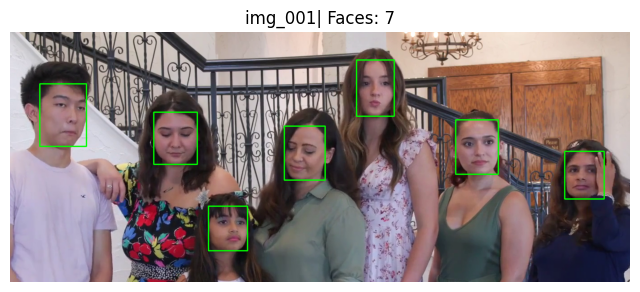

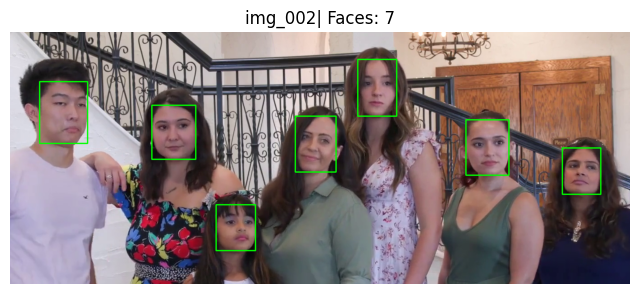

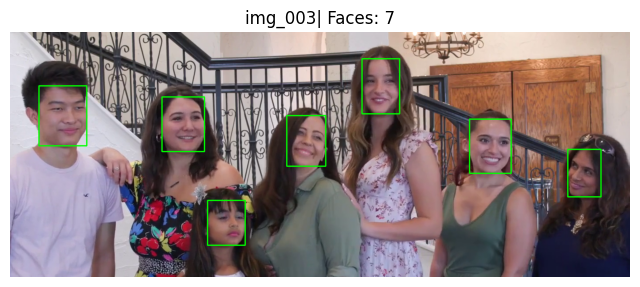

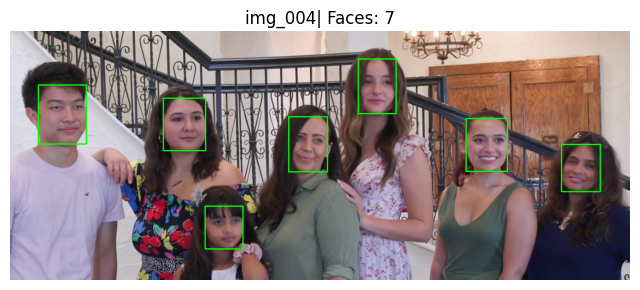

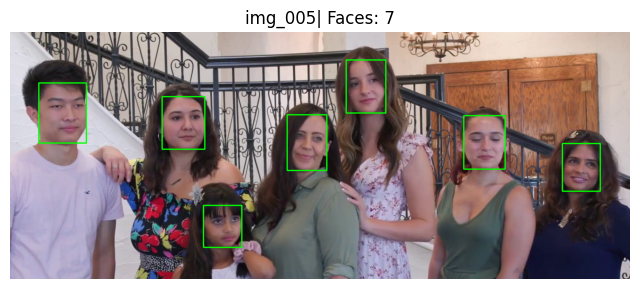

...

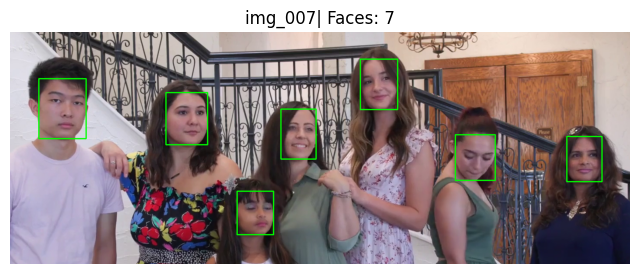

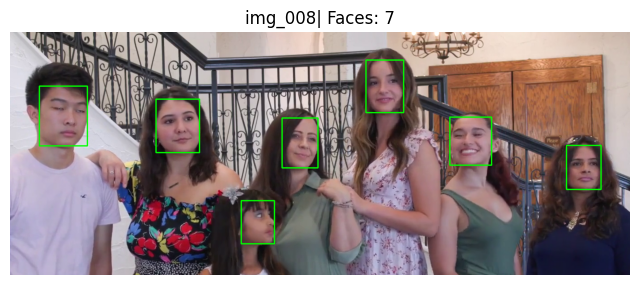

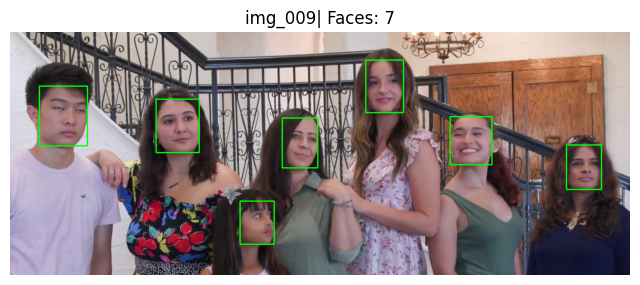

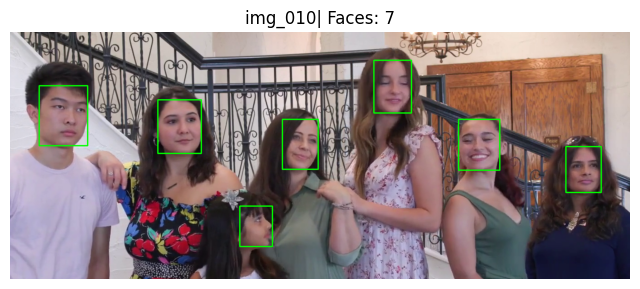

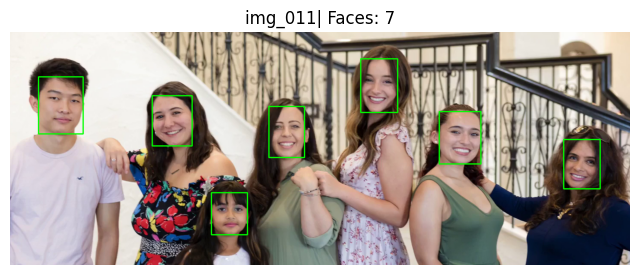

In [12]:
# Show the faces in the image
for photo in group_img:
    img_work = group_img[photo]['img_work'].copy()
    detected_faces = group_img[photo]['faces']
    for face in detected_faces:
        x, y, w, h = face['facial_area'].values()
        
        cv2.rectangle(img_work, (x, y), (x+w, y+h), (0, 255, 0), 2)
    show_rgb_image(img_work, title=photo+'| Faces: '+str(len(detected_faces)), figsize=(8, 6))

In [13]:
# Analyze faces emotions
emotions_name = ['angry', 'disgust', 'fear', 'happy', 'sad', 'surprise', 'neutral']
emotions_enum = [      6,         3,      5,       0,     4,          2,         1]

for photo in group_img:
    print('photo:',photo)
    img_work = group_img[photo]['img_work']
    img_height, img_width, _ = img_work.shape
    detected_faces = group_img[photo]['faces']

    progress_bar = tqdm(total=len(detected_faces), position=0, leave=True)
    margin = 0.5
    for face in detected_faces:
        x, y, w, h = face['facial_area'].values()
        x = max(x - int(margin * w), 0)
        y = max(y - int(margin * h), 0)
        w = min(w + int(2 * margin * w), img_width - x)
        h = min(h + int(2 * margin * h), img_height - y)
        face_img = img_work[y:y+h, x:x+w]

        # Analyze the emotions
        emotion = DeepFace.analyze(face_img, actions=['emotion'], detector_backend = backends)

        if len(emotion) > 1:
            # Select the face with the highest confidence
            emotion = sorted(emotion, key=lambda x: x['face_confidence'], reverse=True)
            emotion = [emotion[0]]

        face['emotion'] = emotion[0]['emotion']
        face['dominant_emotion'] = emotion[0]['dominant_emotion']

        progress_bar.update(1)
    progress_bar.close()


photo: img_001


  0%|          | 0/7 [00:00<?, ?it/s]

100%|██████████| 7/7 [01:11<00:00, 10.21s/it]


photo: img_002


100%|██████████| 7/7 [00:55<00:00,  7.88s/it]


photo: img_003


100%|██████████| 7/7 [00:56<00:00,  8.06s/it]


photo: img_004


100%|██████████| 7/7 [00:43<00:00,  6.21s/it]


photo: img_005


100%|██████████| 7/7 [00:45<00:00,  6.45s/it]


photo: img_006


100%|██████████| 7/7 [00:21<00:00,  3.07s/it]


photo: img_007


100%|██████████| 7/7 [00:23<00:00,  3.37s/it]


photo: img_008


100%|██████████| 7/7 [00:26<00:00,  3.81s/it]


photo: img_009


100%|██████████| 7/7 [00:09<00:00,  1.42s/it]


photo: img_010


100%|██████████| 7/7 [00:11<00:00,  1.57s/it]


photo: img_011


100%|██████████| 7/7 [00:23<00:00,  3.32s/it]


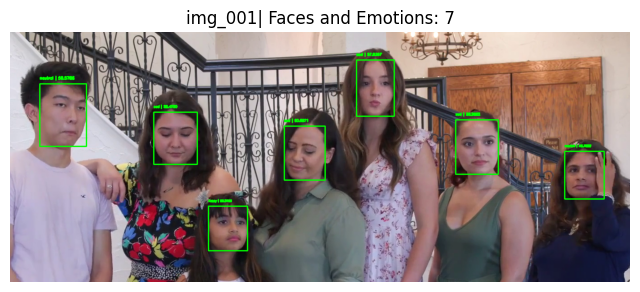

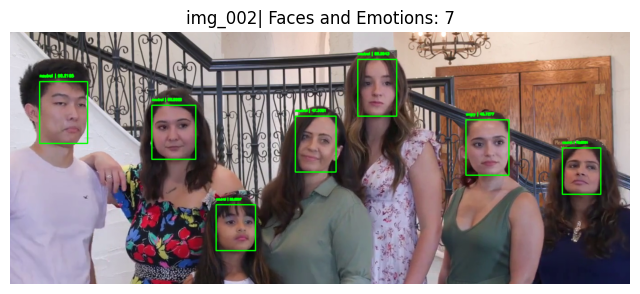

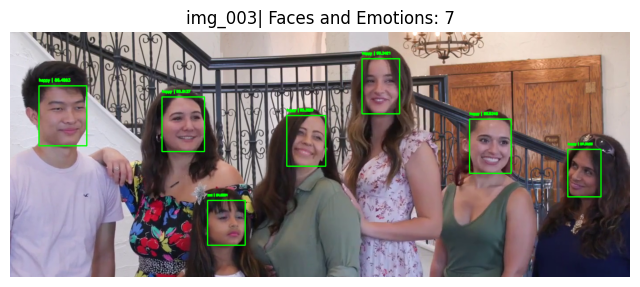

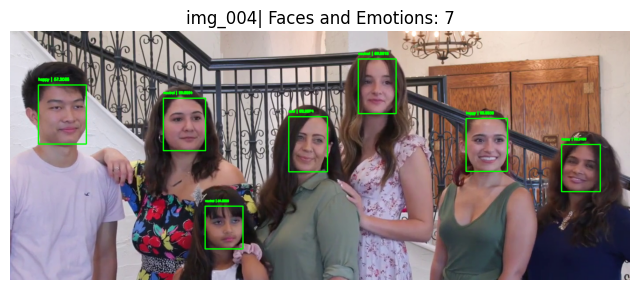

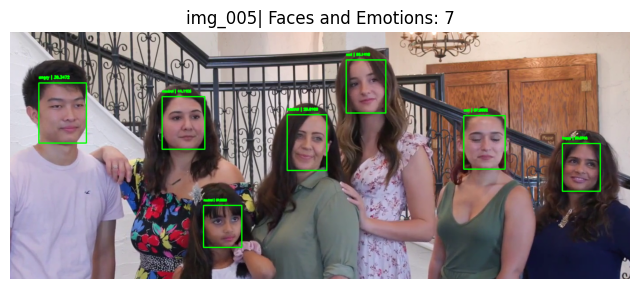

...

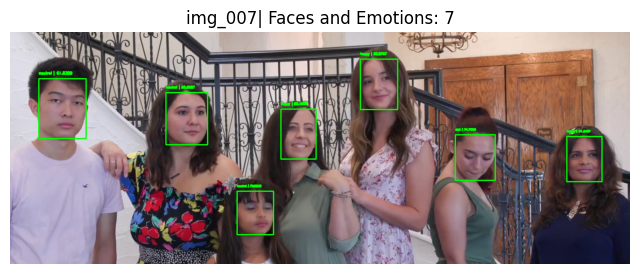

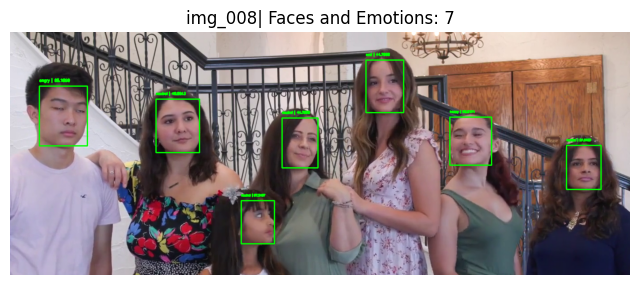

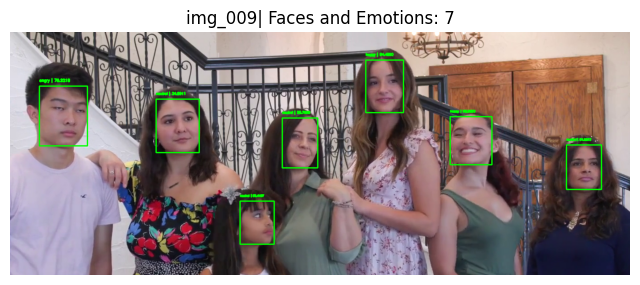

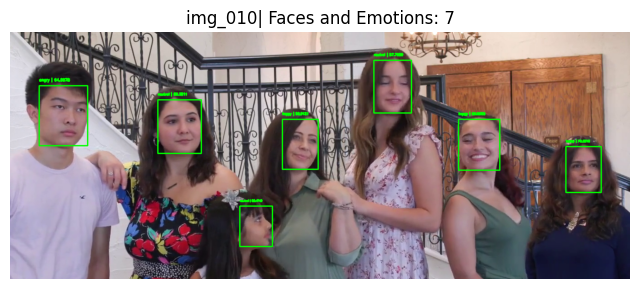

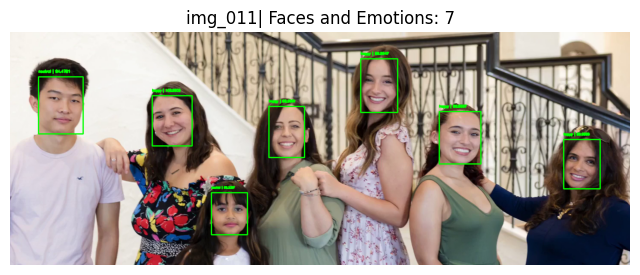

In [14]:
# Show the emotion faces in the image
for photo in group_img:
    img_work = group_img[photo]['img_work'].copy()
    detected_faces = group_img[photo]['faces']
    for face in detected_faces:
        x, y, w, h = face['facial_area'].values()
        cv2.rectangle(img_work, (x, y), (x+w, y+h), (0, 255, 0), 2)

        emotion = face['dominant_emotion']
        emotiton_confidence = face['emotion'][emotion]
            # Add the emotion to the image
        title = f'{emotion} | {emotiton_confidence:.4f}'
        # Fit the text to the image
        font_size = h * FONT_SCALE
        cv2.putText(img_work, title, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, font_size, (0, 255, 0), 2)

        
    show_rgb_image(img_work, title=photo+'| Faces and Emotions: '+str(len(detected_faces)), figsize=(8, 6))

In [15]:
# Sumarize the emotions
for photo in group_img:
    detected_faces = group_img[photo]['faces']

    # Create a dictionary with the emotions
    emotions = {}
    for emotion in emotions_name:
        emotions[emotion+'_n'] = int(0)
        emotions[emotion] = float(0.0)
    # Create a numpy array with the mean of the emotions
    emotions_avg = np.zeros(7)

    # Score of the photo
    general_score = 0
    
    for face in detected_faces:
        emotion = np.array(list(face['emotion'].values()))
        emotions_avg += emotion

        dominant_emotion = face['dominant_emotion']
        emotions[dominant_emotion+'_n'] += 1
        general_score -= emotions_enum[emotions_name.index(dominant_emotion)]
        
    # Average the emotions
    emotions_avg = emotions_avg / len(detected_faces)
    for i, emotion in enumerate(emotions_name):
        # emotions[emotion] = [emotions[emotion+'_n'],emotions_avg[i]]
        emotions[emotion] = emotions_avg[i]

    group_img[photo]['emotions'] = emotions
    group_img[photo]['general_score'] = general_score


# Dataframe with the emotions
df_emotions = pd.DataFrame([group_img[photo]['emotions'] for photo in group_img], index=[photo for photo in group_img])
df_emotions['general_score'] = [group_img[photo]['general_score'] for photo in group_img]
cols = list(df_emotions.columns)
cols.insert(0, cols.pop(cols.index('happy')))           
cols.insert(0, cols.pop(cols.index('happy_n')))
cols.insert(0, cols.pop(cols.index('general_score')))
df_emotions = df_emotions.loc[:, cols]

df_emotions.sort_values(by=['general_score','happy_n','happy'], ascending=False, inplace=True)

pd.set_option("display.precision", 4)
display(df_emotions)

,general_score,happy_n,happy,angry_n,angry,disgust_n,disgust,fear_n,fear,sad_n,sad,surprise_n,surprise,neutral_n,neutral
img_011,-2,5,78.1292,0,0.0029,0,4.3730e-05,0,0.2812,0,0.5846,0,0.0003,2,21.0017
img_003,-4,6,82.4868,0,0.0538,0,2.7445e-05,0,0.2157,1,12.2294,0,0.0579,0,4.9564
img_004,-7,3,45.6794,0,1.3267,0,1.3105e-02,0,1.9690,1,15.3852,0,0.0319,3,35.5948
img_007,-7,3,44.0298,0,4.9357,0,1.3398e-04,0,1.6326,1,14.9490,0,0.1694,3,34.2833
img_010,-9,3,33.6921,1,13.1273,0,6.8421e-02,0,1.7296,0,8.5199,0,0.8137,3,42.0489
img_009,-10,2,25.9864,1,15.5903,0,3.6901e-02,0,2.0597,0,10.2842,0,0.2714,4,45.7710
img_002,-12,0,10.4379,1,8.1393,0,1.1702e-02,0,2.2957,0,9.2885,0,0.3689,6,69.4581
img_006,-13,2,25.5289,1,11.5553,0,4.8871e-02,0,4.2874,1,25.2009,0,0.1714,3,33.2073
img_008,-14,1,21.2305,1,13.6106,0,1.3900e-02,0,3.0398,1,14.3352,0,0.7866,4,46.9834
img_005,-17,1,15.4252,1,8.6461,0,3.0667e-02,0,5.2301,2,29.1336,0,0.0851,3,41.4492


Best photo: img_011


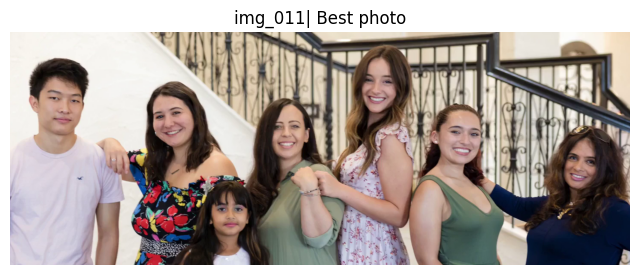

In [16]:
# Choose the best photo
best_photo = df_emotions.index[0]
print('Best photo:', best_photo)
show_rgb_image(group_img[best_photo]['img_work'], title=best_photo+'| Best photo', figsize=(8, 6))

In [17]:
# Compare embeddings and find the most similar faces
def compare_embeddings(face_A : dict, detected_faces_B : list, threshold : float = 7.0) -> (int, float):
    distances = []
    # Get the embedding of face A
    face_A_emb = face_A['embedding']
    # Compute the distances
    for i, face_B in enumerate(detected_faces_B):
        face_B_emb = face_B['embedding']
        distance = np.linalg.norm(face_A_emb - face_B_emb)
        distances.append([i, distance])
    # Sort the distances
    distances = sorted(distances, key=lambda x: x[1], reverse=False)

    # Return the most similar face and the distance
    if distances[0][1] < threshold:
        return distances[0][0], distances[0][1]
    else :
        return -1, -1


In [18]:
# Compare the faces in the images
for photo_A in group_img:
    detected_faces_A = group_img[photo_A]['faces']
    # Array to store the similar faces
    for face_A in detected_faces_A:
        face_A['similar_face'] = []

    for photo_B in group_img:
        if photo_A == photo_B:
            continue
        detected_faces_B = group_img[photo_B]['faces']
        for face_A in detected_faces_A:
            # Compare the embeddings
            i, distance = compare_embeddings(face_A, detected_faces_B, threshold=7.0)

            # If the distance is too high, continue
            if i == -1:
                continue 

            # Store the similar face and the distance
            similar = {}
            similar['img_name'] = photo_B
            similar['face_index'] = i
            similar['distance'] = distance
            face_A['similar_face'].append(similar)

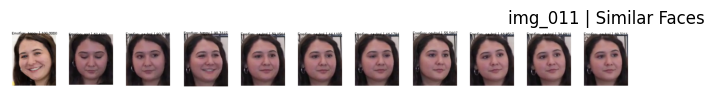

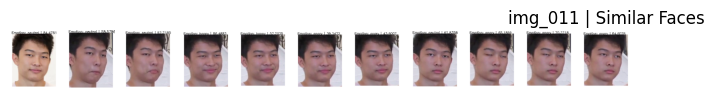

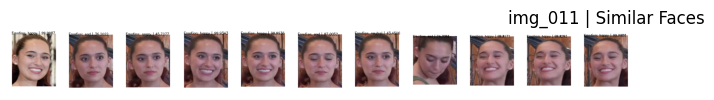

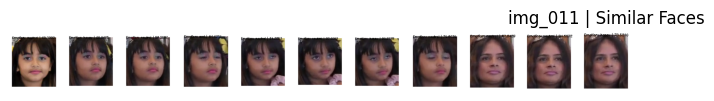

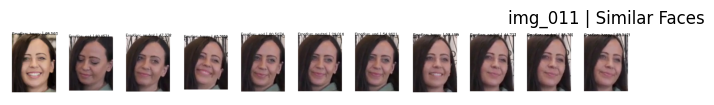

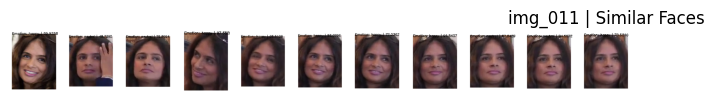

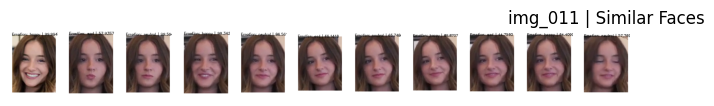

In [19]:
# Show the similar faces in the images
for photo_A in [best_photo]:
    img_work_A = group_img[photo_A]['img_work'].copy()
    detected_faces_A = group_img[photo_A]['faces']

    for face_A in detected_faces_A:
        img_face_A = crop_face_from_image(img_work_A, face_A, margin=0.2)
        img_face_similar = []
        for similar in face_A['similar_face']:
            photo_B = similar['img_name']
            i = similar['face_index']
            img_work_B = group_img[photo_B]['img_work'].copy()
            face_B = group_img[photo_B]['faces'][i]
            img_face_B = crop_face_from_image(img_work_B, face_B, margin=0.2)
            img_face_similar.append(img_face_B)
        # plot the images
        img_face_similar = [img_face_A] + img_face_similar
        show_rgb_image(img_face_similar, title=photo_A+' | Similar Faces', array_align='horizontal', figsize=(8, 5))
        


In [20]:
# Choose the best face for each similar 

for photo_A in [best_photo]:
    detected_faces_A = group_img[photo_A]['faces']

    for face_A_index, face_A in enumerate(detected_faces_A):
        dominant_emotion = face_A['dominant_emotion']
        dominant_emotion_index = emotions_enum[emotions_name.index(dominant_emotion)]
        best_face = [[dominant_emotion_index,face_A['emotion'][dominant_emotion],photo_A,face_A_index]]
        
        for i, similar in enumerate(face_A['similar_face']):
            photo_B = similar['img_name']
            face_index = similar['face_index']
            face_B = group_img[photo_B]['faces'][face_index]
            dominant_emotion = face_B['dominant_emotion']
            dominant_emotion_index = emotions_enum[emotions_name.index(dominant_emotion)]
            best_face.append([dominant_emotion_index,face_B['emotion'][dominant_emotion],photo_B,face_index])

        best_face_in_best_photo = best_face[0]
        # sort the emotions 
        best_face = sorted(sorted(best_face, key=lambda x: x[1], reverse=True), key=lambda x: x[0], reverse=False)
        # print('Best face:', best_face[0], 'Best face in best photo:', best_face_in_best_photo)
        if best_face_in_best_photo[0] != best_face[0][0]:
            best_face = best_face[0]
            # print('Different emotions')
        else :
            # Distance of expression
            diff = best_face_in_best_photo[1] - best_face[0][1]
            if diff < -5.0:
                best_face = best_face[0]
                # print('Find a better')
            else:
                best_face = best_face_in_best_photo
                # print('Best face in best photo')

        dict_best_face = {}
        dict_best_face['dominant_emotion_index'] = best_face[0]
        dict_best_face['emotion_confidence'] = best_face[1]
        dict_best_face['photo'] = best_face[2]
        dict_best_face['face_index'] = best_face[3]

        
        face_A['best_face'] = dict_best_face
        print('face_A[best_face] =',face_A['best_face'])

face_A[best_face] = {'dominant_emotion_index': 0, 'emotion_confidence': 99.99998807907104, 'photo': 'img_011', 'face_index': 0}
face_A[best_face] = {'dominant_emotion_index': 0, 'emotion_confidence': 86.48825287818909, 'photo': 'img_003', 'face_index': 2}
face_A[best_face] = {'dominant_emotion_index': 0, 'emotion_confidence': 99.99871253967285, 'photo': 'img_011', 'face_index': 2}
face_A[best_face] = {'dominant_emotion_index': 0, 'emotion_confidence': 90.27782024608972, 'photo': 'img_006', 'face_index': 2}
face_A[best_face] = {'dominant_emotion_index': 0, 'emotion_confidence': 98.5930501576096, 'photo': 'img_011', 'face_index': 4}
face_A[best_face] = {'dominant_emotion_index': 0, 'emotion_confidence': 99.92564916167552, 'photo': 'img_011', 'face_index': 5}
face_A[best_face] = {'dominant_emotion_index': 0, 'emotion_confidence': 99.99468922583397, 'photo': 'img_011', 'face_index': 6}


In [21]:
# Count the number of best faces per photo
best_faces_count = { photo: 0 for photo in group_img}
detected_faces_A = group_img[best_photo]['faces']
for face_A in detected_faces_A:
    photo_B = face_A['best_face']['photo']
    best_faces_count[photo_B] += 1
print('Best photo:', best_photo)
print('Best faces count:')
_ = [print(f'{photo}: {count}') for photo, count in best_faces_count.items()]


Best photo: img_011
Best faces count:
img_001: 0
img_002: 0
img_003: 1
img_004: 0
img_005: 0
img_006: 1
img_007: 0
img_008: 0
img_009: 0
img_010: 0
img_011: 5


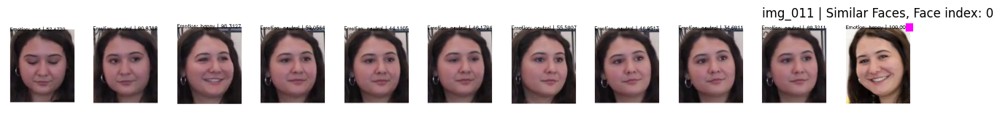

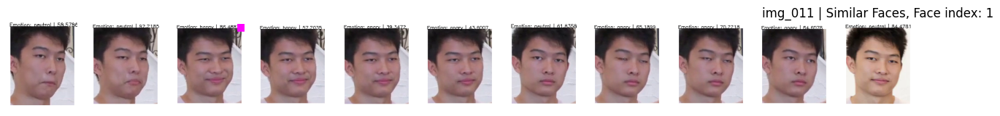

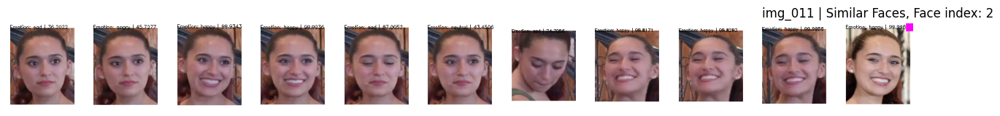

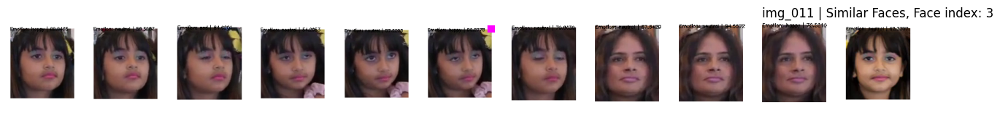

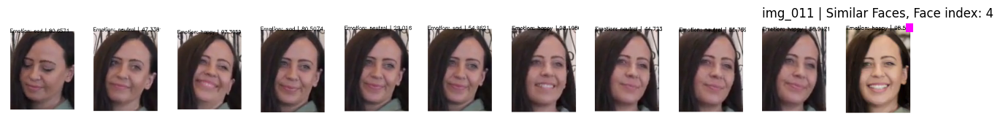

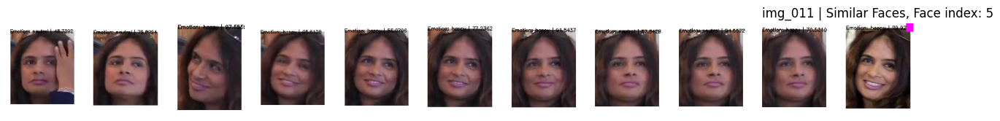

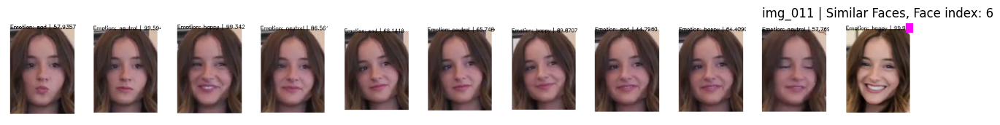

In [22]:
# Show the similar faces in the images and the best face
group_img_keys = list(group_img.keys())
for photo_A in [best_photo]:
    img_work_A = group_img[photo_A]['img_work'].copy()
    detected_faces_A = group_img[photo_A]['faces']

    for face_A_index, face_A in enumerate(detected_faces_A):
        img_faces = [None for _ in group_img_keys]
        img_face_A = crop_face_from_image(img_work_A, face_A, margin=0.2)
        img_faces[group_img_keys.index(photo_A)] = img_face_A
        for similar in face_A['similar_face']:
            # Get the file name
            photo_B = similar['img_name']
            # Get the index of the face
            i = similar['face_index']
            img_work_B = group_img[photo_B]['img_work'].copy()
            face_B = group_img[photo_B]['faces'][i]

            img_face_B = crop_face_from_image(img_work_B, face_B, margin=0.2)
            img_faces[group_img_keys.index(photo_B)] = img_face_B
        
        best_face = face_A['best_face']
        img_best_face = img_faces[group_img_keys.index(best_face['photo'])]
        # Add a purple filled square top right of the img_best_face
        h, w, _ = img_best_face.shape
        x0 = int(0.9 * w)
        y0 = int(0.1 * h)
        x1 = w
        y1 = 0
        cv2.rectangle(img_best_face, (x0, y0), (x1, y1), (255, 0, 255), -1)

        # plot the images
        save_path = os.path.join(output_dir, photo_A+'_Face_'+str(face_A_index)+'.png')
        show_rgb_image(img_faces, title=photo_A+' | Similar Faces, Face index: '+str(face_A_index), array_align='horizontal', figsize=(16, 7), save=True, save_path=save_path)


In [23]:
change_best_face = []
# change_best_face.append([1,0])
# change_best_face.append([2,3])
# change_best_face.append([5,0])
# change_best_face.append([7,1])
# change_best_face.append([12,5])
# change_best_face.append([15,1])
# change_best_face.append([17,2])
# change_best_face.append([21,5])
# change_best_face.append([24,5])
# change_best_face.append([28,5])
# change_best_face.append([29,4])
# change_best_face.append([31,5])
# change_best_face.append([33,5])
# change_best_face.append([35,5])


In [24]:
# Manual selection of the best face
group_img_keys = list(group_img.keys())
def select_best_face(photo_A : str, face_index = 0, similar_face_index = 0):
    detected_faces_A = group_img[photo_A]['faces']
    face_A = detected_faces_A[face_index]
    photo_B = group_img_keys[similar_face_index]
    for similar in face_A['similar_face']:
        if similar['img_name'] == photo_B:
            face_B = group_img[photo_B]['faces'][similar['face_index']]
            face_B_index = similar['face_index']
            break

    dict_best_face = {}
    dominant_emotion = face_B['dominant_emotion']
    dominant_emotion_index = emotions_enum[emotions_name.index(dominant_emotion)]
    dict_best_face['dominant_emotion_index'] = dominant_emotion_index
    dict_best_face['emotion_confidence'] = face_B['emotion'][dominant_emotion]
    dict_best_face['photo'] = photo_B
    dict_best_face['face_index'] = face_B_index

    face_A['best_face'] = dict_best_face

for change in change_best_face:
    select_best_face(best_photo, face_index = change[0], similar_face_index = change[1])

Exchange faces:
img_001: 0
img_002: 0
img_003: 1
  img_003 -> img_011
  {'x': 194, 'y': 146, 'w': 237, 'h': 364} -> {'x': 239, 'y': 122, 'w': 228, 'h': 359}


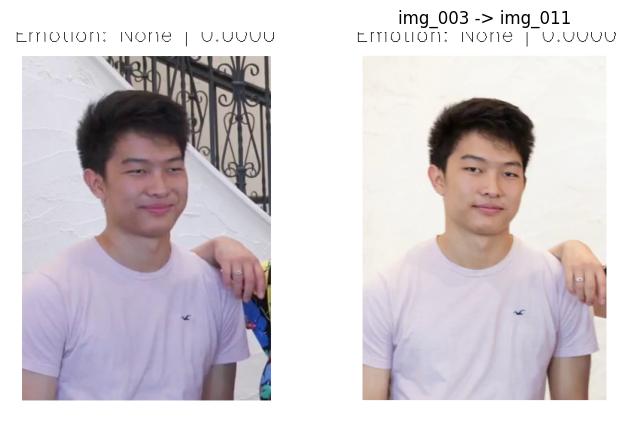

img_004: 0
img_005: 0
img_006: 1
  img_006 -> img_011
  {'x': 587, 'y': 431, 'w': 189, 'h': 259} -> {'x': 654, 'y': 406, 'w': 184, 'h': 264}


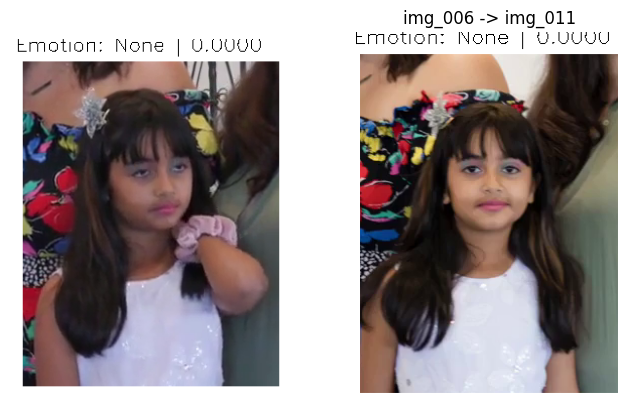

img_007: 0
img_008: 0
img_009: 0
img_010: 0
img_011: 0
Exchange faces saved: ./Example/Output/exchange_faces.json


In [25]:
def expand_facial_area(facial_area, img, margin = [0.6, 0.4, 0.6, 1.3]):
    if isinstance(margin, (int, float)):
        margin = [margin, margin, margin, margin]

    img_h, img_w, _ = img.shape
    x, y, w, h = facial_area.values()
    x = max(x - int(margin[0] * w), 0)
    y = max(y - int(margin[1] * h), 0)
    w = min(w + int((margin[2] + margin[0]) * w), img_w - x)
    h = min(h + int((margin[3] + margin[1]) * h), img_h - y)

    return {'x': x, 'y': y, 'w': w, 'h': h}

# Extract coordinates of the best face different from the best photo
exchange_faces = {photo: [] for photo in group_img}
detected_faces_A = group_img[best_photo]['faces']
for face_A in detected_faces_A:
    photo_B = face_A['best_face']['photo']
    if photo_B != best_photo:
        source = {}
        source['photo'] = photo_B
        face_B = face_A['best_face']['face_index']
        facial_area = group_img[photo_B]['faces'][face_B]['facial_area'].copy()
        
        # Recover the facial area in the original image
        facial_area['x'] = facial_area['x'] + group_img[photo_B]['area_faces'][0]
        facial_area['y'] = facial_area['y'] + group_img[photo_B]['area_faces'][1]

        source['facial_area'] = expand_facial_area(facial_area, group_img[photo_B]['img_original'])

        destiny = {}
        destiny['photo'] = best_photo
        facial_area = face_A['facial_area'].copy()

        # Recover the facial area in the original image
        facial_area['x'] = facial_area['x'] + group_img[best_photo]['area_faces'][0]
        facial_area['y'] = facial_area['y'] + group_img[best_photo]['area_faces'][1]

        destiny['facial_area'] = expand_facial_area(facial_area, group_img[best_photo]['img_original'])

        swap_face = {'source': source, 'destiny': destiny}

        exchange_faces[photo_B].append(swap_face)
    
print('Exchange faces:')
for photo in exchange_faces:
    print(f'{photo}: {len(exchange_faces[photo])}')
    for swap_face in exchange_faces[photo]:
        print(f'  {swap_face["source"]["photo"]} -> {swap_face["destiny"]["photo"]}')
        print(f'  {swap_face["source"]["facial_area"]} -> {swap_face["destiny"]["facial_area"]}')
        img_src = group_img[swap_face["source"]["photo"]]['img_original']
        img_dst = group_img[swap_face["destiny"]["photo"]]['img_original']
        face_src = swap_face["source"]["facial_area"]
        face_dst = swap_face["destiny"]["facial_area"]

        img_face_A = crop_face_from_image(img_src, {'facial_area': face_src}, margin=0.2)
        img_face_B = crop_face_from_image(img_dst, {'facial_area': face_dst}, margin=0.2)
        img_face_similar = [img_face_A, img_face_B]
        show_rgb_image(img_face_similar, title=f'{swap_face["source"]["photo"]} -> {swap_face["destiny"]["photo"]}', array_align='horizontal', figsize=(8, 5))
        

# Save exchange faces as json
exchange_faces_path = os.path.join(output_dir, 'exchange_faces.json')
with open(exchange_faces_path, 'w') as file:
    json.dump(exchange_faces, file, indent=4)
print('Exchange faces saved:', exchange_faces_path)